# Librerias

In [230]:
#Analisis y exploracion de los datos
import numpy as np 
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)
import seaborn as sns
import math

#preprocesamiento
import multiprocessing
from sklearn.experimental import enable_iterative_imputer
#from sklearn.impute import SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
#from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
#from sklearn.compose import make_column_selector
from sklearn.model_selection import train_test_split
#import random
#from itertools import product

#Modelos y entrenamiento
from sklearn.model_selection import RandomizedSearchCV, RepeatedKFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

#Evaluacion
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.inspection import permutation_importance

# Analisis Exploratorio

In [2]:
#Carga de los datos limpios y observando la cantidad de filas y columnas
data_clean = pd.read_csv("C:/Users/Michael Kevin/Documents/ProyectoDiplomado/PrediccionPreciosCasas/clean_house.csv")
data_clean

,index,referencia,titulo_anuncio,estado_casa,departamento,ubicacion,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
0,0,E457CA,En venta casa de Lujo en Las Palmas,Excelente estado,Santa Cruz,Las Palmas_ Las palmas_ Santa Cruz,4.0,3,600.0,1.0,650.0,2.0,850000.0,NaN
1,1,Q67923,CASA EN VENTA EN LAS PALMAS,Excelente estado,Santa Cruz,ENTRE 3ER Y 4TO ANILLO C/ BAHIA CACERES Y CAPA...,4.0,3,726.0,1.0,NaN,2.0,685000.0,NaN
2,2,WC49A9,"CASA EN VENTA, IRPAVI",Buen estado,La Paz,CALLE 18 Y OVANDO_ Irpavi_ La Paz,3.0,3,643.0,1.0,643.0,3.0,449000.0,NaN
3,3,Z7FD7E,Casa en venta sobre Av. Canal Isuto,Excelente estado,Santa Cruz,sobre Av. Canal Isuto entre 4to y 5to anillo_ ...,5.0,2,194.0,1.0,194.0,NaN,139000.0,NaN
4,4,OF956B,"casa a estrenar, 4 dormitorios, Condominio Los...",A estrenar,Santa Cruz,condominio Los parques 3_ Urubó_ Santa Cruz,4.0,3,158.0,2.0,158.0,1.0,149000.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003,1043,6219C,Casa en Venta - La Paz,Excelente estado,La Paz,Calle 2 de Febrero_ entre calles 6 y 7 de Mall...,3.0,3,178.0,2.0,300.0,2.0,190000.0,10.0
1004,1044,17E58,"Urbanización San Jorge, haz tu reserva ya con ...",A estrenar,Santa Cruz,avenida G-77 y Beni a la altura del noveno ani...,3.0,2,258.0,1.0,110.0,2.0,67500.0,5.0
1005,1046,A69AD,"Casa Condominio Dalí, 3 dorm.,a/c, área social...",Excelente estado,Santa Cruz,casa nro 35 Condominio Dalí. cel *** _ Remanso...,3.0,3,250.0,1.0,150.0,2.0,115000.0,9.0
1006,1047,7BC18,Casa equipada,Excelente estado,Santa Cruz,Sur_ Santa Cruz,4.0,3,300.0,1.0,165.0,NaN,108000.0,NaN


## Analisis Univariado

In [3]:
#Resumen de los datos
data_clean.info()

#Resumen general de los datos numericos
print()
#data_clean.describe(include='all')
data_clean.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1008 entries, 0 to 1007
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             1008 non-null   int64  
 1   referencia        1008 non-null   object 
 2   titulo_anuncio    1008 non-null   object 
 3   estado_casa       1008 non-null   object 
 4   departamento      1008 non-null   object 
 5   ubicacion         1008 non-null   object 
 6   nro_habitaciones  992 non-null    float64
 7   nro_baño          1008 non-null   int64  
 8   m2_terreno        1005 non-null   float64
 9   nro_plantas       963 non-null    float64
 10  m2_edificados     1002 non-null   float64
 11  nro_garajes       945 non-null    float64
 12  precio_venta      1000 non-null   float64
 13  antiguedad        676 non-null    float64
dtypes: float64(7), int64(2), object(5)
memory usage: 110.4+ KB



,index,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
count,1008.000000,992.000000,1008.000000,1005.000000,963.000000,1002.000000,945.000000,1.000000e+03,676.000000
mean,511.440476,3.566532,2.640873,1551.180100,1.662513,977.304391,2.131217,3.641188e+05,7.155325
std,299.450063,0.852141,0.648883,11753.766159,0.634520,11452.504971,0.718792,3.907112e+06,7.607082
min,0.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.450000e+02,0.000000
25%,253.750000,3.000000,2.000000,204.000000,1.000000,143.000000,2.000000,9.500000e+04,2.000000
50%,506.500000,3.000000,3.000000,300.000000,2.000000,208.000000,2.000000,1.490000e+05,5.000000
75%,761.250000,4.000000,3.000000,450.000000,2.000000,360.000000,3.000000,2.712500e+05,9.000000
max,1048.000000,5.000000,8.000000,292500.000000,3.000000,309500.000000,8.000000,1.234568e+08,53.000000


In [4]:
def var_nums(dfx):
    numeric_data = dfx.select_dtypes(include=[np.number])
    return numeric_data
def var_cats(dfx):
    cat_data = dfx.select_dtypes(include=['object'])
    return cat_data

In [5]:
#Cantidad de tipos de datos
print(data_clean.dtypes.value_counts(),"\n")

#Cantidad de variables numericas y categoricas en los datos
numeric_data=var_nums(data_clean)
cat_data=var_cats(data_clean)
print ("Existen",numeric_data.shape[1],"variables numericas y",cat_data.shape[1] ,"variables categoricas")

float64    7
object     5
int64      2
dtype: int64 

Existen 9 variables numericas y 5 variables categoricas


m2_terreno            3
m2_edificados         6
precio_venta          8
nro_habitaciones     16
nro_plantas          45
nro_garajes          63
antiguedad          332
dtype: int64


  0%|          | 0/174 [00:00<?, ?it/s]


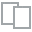
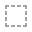
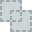
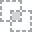
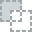
...
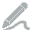
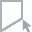
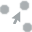
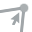
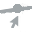

In [6]:
#Cantidad de datos faltantes

faltantes = data_clean.isnull().sum()
faltantes=faltantes[faltantes>0]
faltantes.sort_values(inplace=True)
print(faltantes)

from dataprep.eda import plot_missing
plot_missing(data_clean)

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

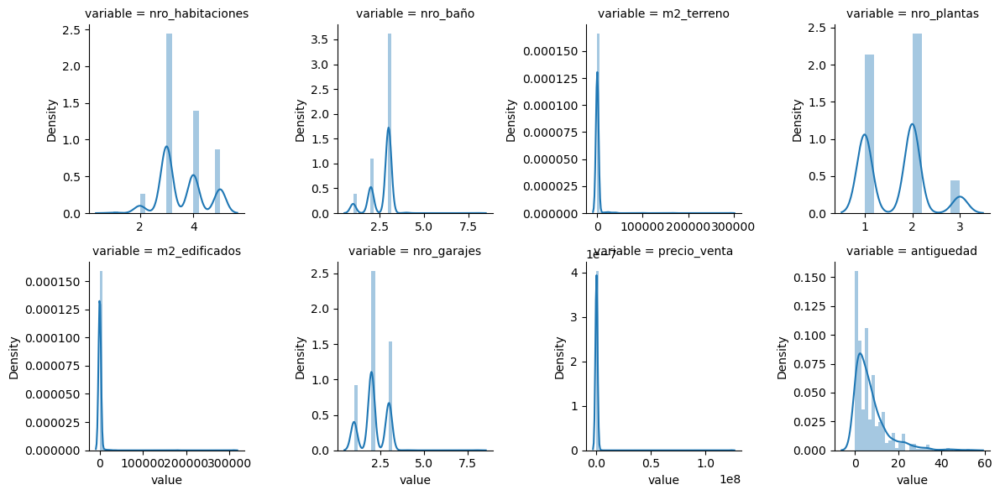

In [7]:
#Verificamos la distribucion de las variable numericas
num = [f for f in data_clean.columns if data_clean.dtypes[f] != 'object']
num.remove('index')
nd = pd.melt(data_clean, value_vars = num)
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-pack

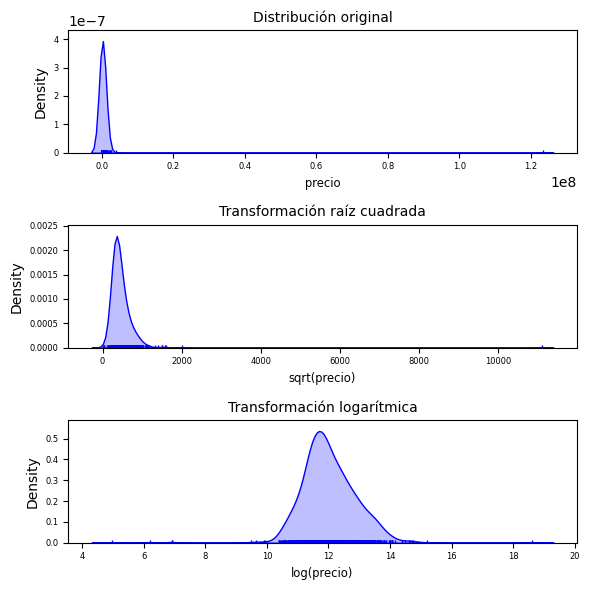

In [8]:
#Analizando la variable respuesta aplicando logaritmo y raiz cuadrado para visualizar mejor su distribucion

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.distplot(
    data_clean['precio_venta'],
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[0]
)
axes[0].set_title("Distribución original", fontsize = 'medium')
axes[0].set_xlabel('precio', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.distplot(
    np.sqrt(data_clean.precio_venta),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[1]
)
axes[1].set_title("Transformación raíz cuadrada", fontsize = 'medium')
axes[1].set_xlabel('sqrt(precio)', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.distplot(
    np.log(data_clean.precio_venta),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[2]
)
axes[2].set_title("Transformación logarítmica", fontsize = 'medium')
axes[2].set_xlabel('log(precio)', fontsize='small') 
axes[2].tick_params(labelsize = 6)

fig.tight_layout()

c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.valu

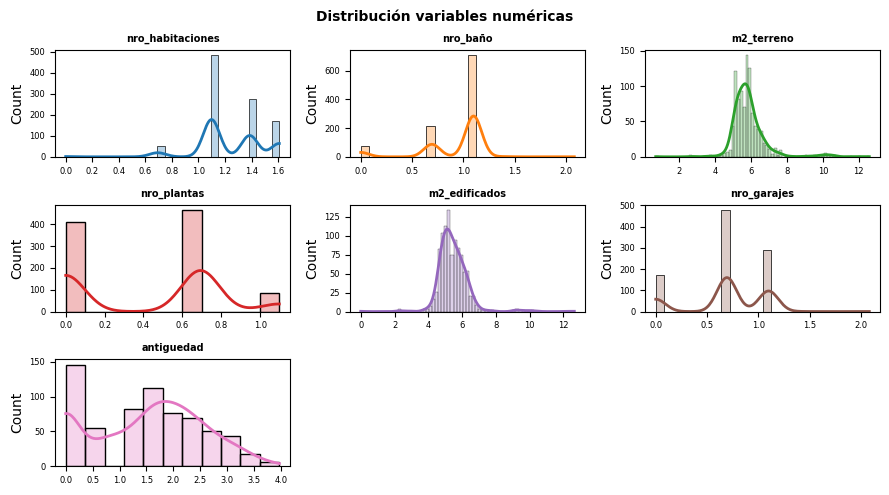

In [9]:
#Aplicando logaritmo a las otras variables numericas

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 5))
axes = axes.flat
columns_numeric = data_clean.select_dtypes(include=['float64', 'int']).columns
columns_numeric = columns_numeric.drop('precio_venta')
columns_numeric = columns_numeric.drop('index')

for i, colum in enumerate(columns_numeric):
    sns.histplot(
        data    = np.log(numeric_data),
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        line_kws= {'linewidth': 2},
        alpha   = 0.3,
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")

# Se eliminan los axes vacíos
for i in [7,8]:
    fig.delaxes(axes[i])  

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('Distribución variables numéricas', fontsize = 10, fontweight = "bold");

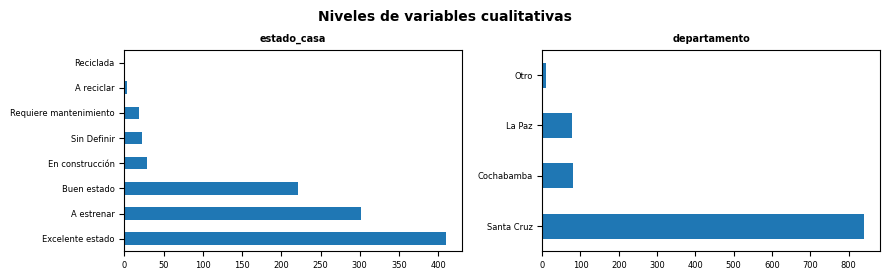

In [10]:
df_util = data_clean.copy()
df_util=df_util.drop(['index','referencia','titulo_anuncio','ubicacion'],axis=1)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 5))
axes = axes.flat
columnas_object = df_util.select_dtypes(include=['object']).columns

for i, colum in enumerate(columnas_object):
    data_clean[colum].value_counts().plot.barh(ax = axes[i])
    axes[i].set_title(colum, fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")

# Se eliminan los axes vacíos
for i in [2, 3]:
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Niveles de variables cualitativas',
             fontsize = 10, fontweight = "bold");

In [11]:
print("Variable: estado de la casa")
print(data_clean['estado_casa'].value_counts(),"\n")
print("Variable: Departamento")
print(data_clean['departamento'].value_counts())


Variable: estado de la casa
Excelente estado          410
A estrenar                302
Buen estado               221
En construcción            29
Sin Definir                23
Requiere mantenimiento     19
A reciclar                  3
Reciclada                   1
Name: estado_casa, dtype: int64 

Variable: Departamento
Santa Cruz    840
Cochabamba     80
La Paz         79
Otro            9
Name: departamento, dtype: int64


## Analisis Bivariado


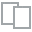
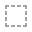
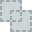
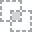
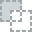
...
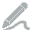
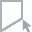
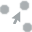
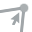
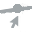

In [12]:
#Analisis de correlacion entre variables
from dataprep.eda import plot_correlation
var_num=numeric_data.drop(columns=['index'])
plot_correlation(var_num)
#plot_correlation(np.log(numeric_data))

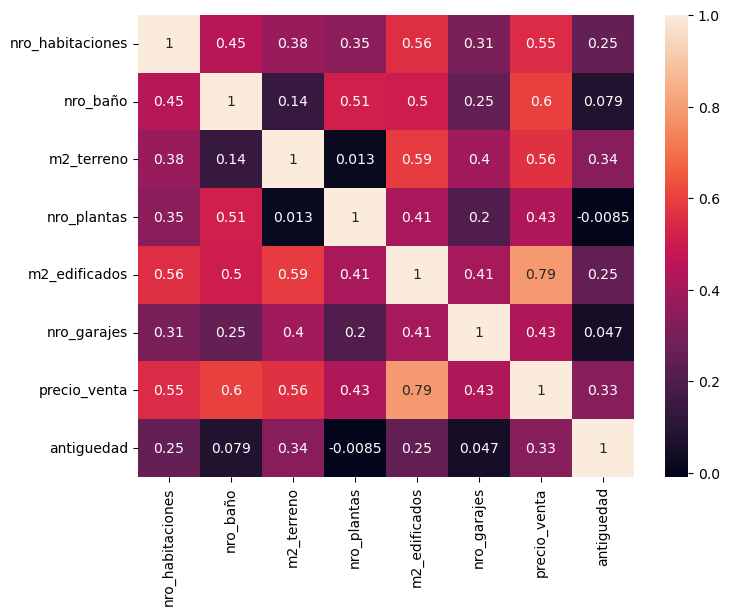

In [13]:
var_num=numeric_data.drop(columns=['index'])
#var_num = var_num.reset_index()
corr_df = var_num.corr(method='spearman')

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\ProgramData\Anaconda3\lib\site-packages\numpy\core\function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
c:\ProgramData\Anaconda3\lib\site-packages\numpy\core\function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
c:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


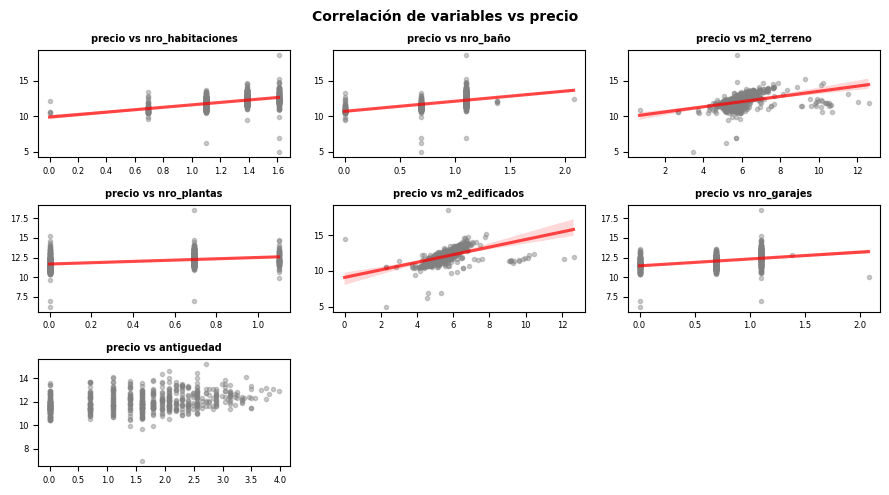

In [14]:
#Verificando correlacion entre las variables numericas predictoras con el precio_venta aplicando logaritmos

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 5))
axes = axes.flat

for i, colum in enumerate(columns_numeric):
    sns.regplot(
        x           = np.log(numeric_data[colum]),
        y           = np.log(numeric_data['precio_venta']),
        #x           = numeric_data[colum],
        #y           = numeric_data['precio_venta'],
        color       = "gray",
        marker      = '.',
        scatter_kws = {"alpha":0.4},
        line_kws    = {"color":"r","alpha":0.7},
        ax          = axes[i]
    )
    axes[i].set_title(f"precio vs {colum}", fontsize = 7, fontweight = "bold")
    #axes[i].ticklabel_format(style='sci', scilimits=(-4,4), axis='both')
    axes[i].yaxis.set_major_formatter(ticker.EngFormatter())
    #axes[i].xaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# Se eliminan los axes vacíos
for i in [7,8]:
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Correlación de variables vs precio', fontsize = 10, fontweight = "bold");

# Preprocesamiento

## Eliminacion de filas y columnas

In [15]:
#Eliminar columnas irrelevantes para los modelos
df1 =data_clean.copy()
df1 = data_clean.drop(columns=['index','referencia', 'titulo_anuncio', 'ubicacion'])
df1

,estado_casa,departamento,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
0,Excelente estado,Santa Cruz,4.0,3,600.0,1.0,650.0,2.0,850000.0,NaN
1,Excelente estado,Santa Cruz,4.0,3,726.0,1.0,NaN,2.0,685000.0,NaN
2,Buen estado,La Paz,3.0,3,643.0,1.0,643.0,3.0,449000.0,NaN
3,Excelente estado,Santa Cruz,5.0,2,194.0,1.0,194.0,NaN,139000.0,NaN
4,A estrenar,Santa Cruz,4.0,3,158.0,2.0,158.0,1.0,149000.0,NaN
...,...,...,...,...,...,...,...,...,...,...
1003,Excelente estado,La Paz,3.0,3,178.0,2.0,300.0,2.0,190000.0,10.0
1004,A estrenar,Santa Cruz,3.0,2,258.0,1.0,110.0,2.0,67500.0,5.0
1005,Excelente estado,Santa Cruz,3.0,3,250.0,1.0,150.0,2.0,115000.0,9.0
1006,Excelente estado,Santa Cruz,4.0,3,300.0,1.0,165.0,NaN,108000.0,NaN


In [16]:
#Eliminacion de la categoria "otro" en la variable departamento
df1 = df1[~(df1.departamento.str.contains("Otro"))]
print(df1.groupby(['departamento'])['departamento'].count())
print("Cantidad de datos:",df1.shape[0])

departamento
Cochabamba     80
La Paz         79
Santa Cruz    840
Name: departamento, dtype: int64
Cantidad de datos: 999


In [57]:
#combinar categorias A reciclar y Reciclada
df2 = df1.copy()
df2['estado_casa']=df2['estado_casa'].replace({"Reciclada":'Buen estado',"A reciclar":'Requiere mantenimiento'})
print(df2['estado_casa'].value_counts())
print(df2.shape)

Excelente estado          404
A estrenar                300
Buen estado               221
En construcción            29
Sin Definir                23
Requiere mantenimiento     22
Name: estado_casa, dtype: int64
(999, 10)


## Analisis de valores atipicos

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:670: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


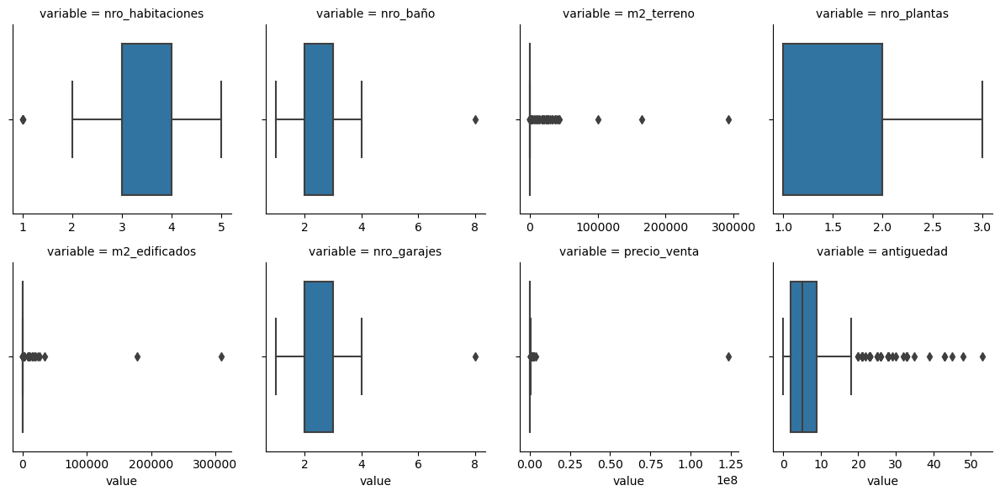

In [70]:
#Creamos funcion graficadora para realizar boxsplot a partir de un dataframe
def boxsplotsCasas(dfx):
    nd = pd.melt(dfx, value_vars = num)
    bp = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
    bp = bp.map(sns.boxplot, 'value')
    return bp
#Graficamos los boxsplots la representacion de los datos y dispersion con respecto a las medidas de tendencia central
boxsplotsCasas(df2)

In [20]:
#funcion para determinar outliers
def var_outliers(df_numx):
    for i in range(len(df_numx.columns)):
        Q1 = np.nanpercentile(df_numx[df_numx.columns[i]], 25)
        Q3 = np.nanpercentile(df_numx[df_numx.columns[i]], 75)
        #IQR= iqr(data_clean['precio_venta'],nan_policy='omit',interpolation='midpoint')
        IQR = Q3 - Q1
        BS =(Q3+1.5*IQR)
        BI =(Q1-1.5*IQR)
        #print('Variable:',df_numx.columns[i],'; su Q1 es:',Q1,'; su Q3 es:',Q3,'; el rango intercuartil es:',IQR)
        var_outlier=(df_numx[df_numx.columns[i]]<BI) | (df_numx[df_numx.columns[i]]>BS)
        print(df_numx.columns[i], 'tiene', var_outlier[var_outlier==True].count(),'dato(s) atipico(s)',
          ';rango entre:',BI, 'y',BS,
          '; porcentaje:',round((var_outlier[var_outlier==True].count())/(df_numx[df_numx.columns[i]].count())*100,2))
    

In [59]:
#Verificamos la cantidad de outliers que hay en las variables numericas
var_num=var_nums(df2)
var_outliers(var_num)

nro_habitaciones tiene 4 dato(s) atipico(s) ;rango entre: 1.5 y 5.5 ; porcentaje: 0.41
nro_baño tiene 1 dato(s) atipico(s) ;rango entre: 0.5 y 4.5 ; porcentaje: 0.1
m2_terreno tiene 96 dato(s) atipico(s) ;rango entre: -165.375 y 819.625 ; porcentaje: 9.64
nro_plantas tiene 0 dato(s) atipico(s) ;rango entre: -0.5 y 3.5 ; porcentaje: 0.0
m2_edificados tiene 58 dato(s) atipico(s) ;rango entre: -185.0 y 687.0 ; porcentaje: 5.84
nro_garajes tiene 1 dato(s) atipico(s) ;rango entre: 0.5 y 4.5 ; porcentaje: 0.11
precio_venta tiene 95 dato(s) atipico(s) ;rango entre: -175000.0 y 545000.0 ; porcentaje: 9.59
antiguedad tiene 51 dato(s) atipico(s) ;rango entre: -8.5 y 19.5 ; porcentaje: 7.61


In [60]:
#Viendo la cantidad de niveles en las variables con pocos niveles
var_nivl = ['nro_garajes','nro_plantas','nro_habitaciones','nro_baño']
for i in range(len(var_nivl)):
    print(var_num[var_nivl[i]].value_counts(),'\n')

2.0    478
3.0    288
1.0    168
4.0      1
8.0      1
Name: nro_garajes, dtype: int64 

2.0    465
1.0    408
3.0     81
Name: nro_plantas, dtype: int64 

3.0    482
4.0    275
5.0    169
2.0     53
1.0      4
Name: nro_habitaciones, dtype: int64 

3    701
2    216
1     77
4      4
8      1
Name: nro_baño, dtype: int64 



In [131]:
#Elimnando outliers de las variables con pocos valores
df3=df2.copy()
varnum_outliers1=(df2['nro_garajes']>3) | (df2['nro_baño']>3) | (df2['nro_habitaciones']==1)
df3=df2[varnum_outliers1==False]
df3.shape

(988, 10)

In [132]:
#Elimnando outliers de las variables m2_terreno,m2_edificados y precio_venta
#Se aplica un 4to nivel de limites intercuartil
df4=df3.copy()
varnum_outliers2=(df3['m2_terreno']>819) | (df3['m2_terreno']<26) | (df3['m2_edificados']>687) | (df3['m2_edificados']<40) | (df3['precio_venta']>545000) | (df3['precio_venta']<15000)
df4=df3[varnum_outliers2==False]
df4.shape

(823, 10)

In [133]:
#Verificamos la cantidad de outliers y su porcentaje
var_numx=var_nums(df4)
var_outliers(var_numx)

nro_habitaciones tiene 0 dato(s) atipico(s) ;rango entre: 1.5 y 5.5 ; porcentaje: 0.0
nro_baño tiene 0 dato(s) atipico(s) ;rango entre: 0.5 y 4.5 ; porcentaje: 0.0
m2_terreno tiene 34 dato(s) atipico(s) ;rango entre: -64.0 y 632.0 ; porcentaje: 4.15
nro_plantas tiene 0 dato(s) atipico(s) ;rango entre: -0.5 y 3.5 ; porcentaje: 0.0
m2_edificados tiene 23 dato(s) atipico(s) ;rango entre: -97.5 y 522.5 ; porcentaje: 2.8
nro_garajes tiene 330 dato(s) atipico(s) ;rango entre: 2.0 y 2.0 ; porcentaje: 42.91
precio_venta tiene 33 dato(s) atipico(s) ;rango entre: -107500.0 y 424500.0 ; porcentaje: 4.04
antiguedad tiene 31 dato(s) atipico(s) ;rango entre: -11.0 y 21.0 ; porcentaje: 5.47


In [134]:
#Cambiando valores en los outliers
#Creamos una funcion que reemplaze los outliers con el valor máximo (media + 2 sigmas).
def val_ct(colx):
    media_x = (colx).mean()
    std_x = (colx).std()*2
    res = round((media_x+std_x),2)
    return  res

"""
#reemplazamos los outliers y revisamos los nuevos cambios
df5 = df4.copy()
df5.loc[(df5.antiguedad>18.5),'antiguedad']=val_ct(df5['antiguedad'])
df5.loc[(df5.m2_terreno>542.5),'m2_terreno']=val_ct(df5['m2_terreno'])
df5.loc[(df5.m2_edificados>392.5),'m2_edificados']=val_ct(df5['m2_edificados'])
df5.loc[(df5.precio_venta>294500.0),'precio_venta']=val_ct(df5['precio_venta'])
var_numx1=var_nums(df5)
print(df5.shape)
var_outliers(var_numx1)
"""
#print(var_num[var_num.antiguedad > 20]['antiguedad'].value_counts())

## Imputacion de valores ausentes

In [97]:
#Volvemos a calcular para saber si a pesar del analisis de datos atipicos siguen existiendo datos nulos
faltantes = df4.isnull().sum()
faltantes=faltantes[faltantes>0]
faltantes.sort_values(inplace=True)
print(faltantes)
print(df4.shape)

m2_terreno            3
m2_edificados         3
precio_venta          6
nro_habitaciones     11
nro_plantas          39
nro_garajes          54
antiguedad          256
dtype: int64
(823, 10)


  0%|          | 0/142 [00:00<?, ?it/s]


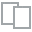
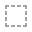
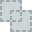
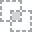
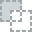
...
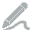
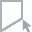
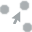
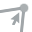
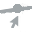

In [224]:
plot_missing(df4)

In [140]:
#Aplicamos Imputación multivariante 
#que usan el conjunto completo de dimensiones de características disponibles para predecir el valor faltante.
df6 =df4.copy()
imp = IterativeImputer(max_iter=10, random_state=0)
df6['precio_venta'] = imp.fit_transform(df6['precio_venta'].values.reshape(-1, 1))
df6['precio_venta'] =df6['precio_venta'].round(2)

df6['m2_terreno'] = imp.fit_transform(df6['m2_terreno'].values.reshape(-1, 1))
df6['m2_terreno'] =df6['m2_terreno'].round(2)

df6['m2_edificados'] = imp.fit_transform(df6['m2_edificados'].values.reshape(-1, 1))
df6['m2_edificados'] =df6['m2_edificados'].round(2)

"""
from sklearn.impute import KNNImputer
imp_knn = KNNImputer(n_neighbors=5, weights="uniform")
df6['antiguedad'] = imp_knn.fit_transform(df6['antiguedad'].values.reshape(-1, 1))
df6['antiguedad'] =df6['antiguedad'].round(2)

from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(strategy='mean')
df6['antiguedad'] = imp_mean.fit_transform(df6['antiguedad'].values.reshape(-1, 1))
"""

#Para estos variables redondeamos a 0 decimales para que no se genere otros valores que no corresponden
df6['antiguedad'] = imp.fit_transform(df6['antiguedad'].values.reshape(-1, 1))
df6['antiguedad'] =df6['antiguedad'].round(0)

df6['nro_habitaciones'] = imp.fit_transform(df6['nro_habitaciones'].values.reshape(-1, 1))
df6['nro_habitaciones'] =df6['nro_habitaciones'].round(0) 

df6['nro_plantas'] = imp.fit_transform(df6['nro_plantas'].values.reshape(-1, 1))
df6['nro_plantas'] = df6['nro_plantas'].round(0)

df6['nro_garajes'] = imp.fit_transform(df6['nro_garajes'].values.reshape(-1, 1))
df6['nro_garajes'] = df6['nro_garajes'].round(0)


faltantes = df6.isnull().sum()
faltantes=faltantes[faltantes>0]
faltantes.sort_values(inplace=True)
print(faltantes)

Series([], dtype: int64)


In [141]:
df6.describe()

,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
count,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000
mean,3.467801,2.616039,304.797570,1.656136,226.989028,2.063183,171609.199514,6.809235
std,0.791451,0.620678,141.948735,0.615776,121.704245,0.630447,108765.748325,6.024994
min,2.000000,1.000000,41.000000,1.000000,41.000000,1.000000,15500.000000,0.000000
25%,3.000000,2.000000,197.500000,1.000000,135.000000,2.000000,92000.000000,3.000000
50%,3.000000,3.000000,288.000000,2.000000,190.000000,2.000000,137000.000000,7.000000
75%,4.000000,3.000000,371.000000,2.000000,290.000000,2.000000,225000.000000,7.000000
max,5.000000,3.000000,819.000000,3.000000,687.000000,3.000000,539000.000000,53.000000


## Separacion de datos de entrenamiento y prueba

In [142]:
#Separamos los datos hasta este punto en datos de entrenamiento y prueba con el 80% de los datos para el entranmiento 
#y 20 % restante para las pruebas
df7 = df6.copy()

X_train, X_test, y_train, y_test = train_test_split(
                                        df7.drop('precio_venta', axis = 'columns'),
                                        df7['precio_venta'],
                                        train_size   = 0.8,
                                        random_state = 123,
                                        shuffle      = True
                                    )

In [143]:
print('datos de entrenamiento')
print(X_train.shape)
print(y_train.shape,'\n')
print('datos de prueba')
print(X_test.shape)
print(y_test.shape)

datos de entrenamiento
(658, 9)
(658,) 

datos de prueba
(165, 9)
(165,)


## Estandarización y binarización

In [146]:
# Funciones para la identificación de columnas numéricas y categóricas
def colums_nums(dfx):
    res = [f for f in dfx.columns if dfx.dtypes[f] != 'object']
    return res

def colums_objects(dfx):
    res = [f for f in dfx.columns if dfx.dtypes[f] == 'object']
    return res


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', RobustScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, colums_nums(X_train)),
                        ('cat', categorical_transformer, colums_objects(X_train))
                    ],
                    remainder='passthrough'
                )



# Modelos

## KNN

### Entrenamiento y tunning

In [271]:
# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', KNeighborsRegressor())])
knnInit = pipe.fit(X=X_train, y=y_train)


# Optimización de hiperparámetros
# Espacio de búsqueda de cada hiperparámetro
param_distributions = {'modelo__n_neighbors': np.linspace(1, 100, 500, dtype=int)}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3), 
        refit      = True, 
        verbose    = 0,
        random_state = 120,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

,param_modelo__n_neighbors,mean_test_score,std_test_score,mean_train_score,std_train_score
8,9,-62660.241131,3780.16095,-56097.165898,901.55902


In [294]:
KNeighborsRegressor().get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

### Evaluación

In [272]:
#Error del test con el modelo incial
predict_knn_1 = knnInit.predict(X_test)
rmse_knn = mean_squared_error(y_true  = y_test, y_pred  = predict_knn_1,squared = False)
mse_knn = mean_squared_error(y_true  = y_test, y_pred  = predict_knn_1,squared = True)
mae_knn = mean_absolute_error(y_true  = y_test, y_pred  = predict_knn_1)
mape_knn= mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_knn_1)

print("Error de test del modelo con los hiperparametros por defecto son:")
print(f"El error (mse) de test es: {mse_knn}")
print(f"El error (rmse) de test es: {rmse_knn}")
print(f"El error (mae) de test es: {mae_knn}")
print(f"El error (mape) de test es: {mape_knn}")

knn_predicciones_1 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_knn_1})
knn_predicciones_1.head()

Error de test del modelo con los hiperparametros por defecto son:
El error (mse) de test es: 3908407687.389702
El error (rmse) de test es: 62517.259116100904
El error (mae) de test es: 43812.581090909094
El error (mape) de test es: 0.2981013387454691


,precio,prediccion
248,450000.0,382900.0
77,54000.0,39600.0
264,72000.0,71200.0
1004,67500.0,54700.0
299,60000.0,121400.0


In [273]:
#Reentrenamiento
# Error de test del modelo final
modelo_knn_final = grid.best_estimator_
predict_knn_2 = modelo_knn_final.predict(X = X_test)
rmse_knn = mean_squared_error(y_true  = y_test, y_pred  = predict_knn_2,squared = False)
mse_knn = mean_squared_error(y_true  = y_test, y_pred  = predict_knn_2,squared = True)
mae_knn = mean_absolute_error(y_true  = y_test, y_pred  = predict_knn_2)
mape_knn= mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_knn_2)

print("Error de test del modelo re-entrenado con los hiperparametros ideales son:")
print(f"El error (mse) de test es: {mse_knn}")
print(f"El error (rmse) de test es: {rmse_knn}")
print(f"El error (mae) de test es: {mae_knn}")
print(f"El error (mape) de test es: {mape_knn}")

knn_predicciones_2 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_knn_2})
knn_predicciones_2.head()

Error de test del modelo re-entrenado con los hiperparametros ideales son:
El error (mse) de test es: 3703551805.574824
El error (rmse) de test es: 60856.81396174814
El error (mae) de test es: 42138.249696969695
El error (mape) de test es: 0.2970465220358302


,precio,prediccion
248,450000.0,365388.888889
77,54000.0,42800.000000
264,72000.0,65888.888889
1004,67500.0,69388.888889
299,60000.0,120666.666667


## Regresión lineal Ridge 

### Entrenamiento y tunning

In [286]:
# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

ridgeInit= pipe.fit(X=X_train, y=y_train)

# Optimización de hiperparámetros
# Espacio de búsqueda de cada hiperparámetro
param_distributions = {'modelo__alpha': np.logspace(-5, 5, 500)}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3), 
        refit      = True, 
        verbose    = 0,
        random_state = 124,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

,param_modelo__alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
5,1.623382,-62147.474328,5428.487211,-59714.838469,1418.642954


In [295]:
Ridge().get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'normalize': 'deprecated',
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.001}

### Evaluación

In [287]:
#Error del test con el modelo inicial
predict_ridge_1 = ridgeInit.predict(X_test)
rmse_ridge = mean_squared_error(y_true  = y_test, y_pred  = predict_ridge_1,squared = False)
mse_ridge = mean_squared_error(y_true  = y_test, y_pred  = predict_ridge_1,squared = True)
mae_ridge = mean_absolute_error(y_true  = y_test, y_pred  = predict_ridge_1)
mape_ridge = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_ridge_1)

print("Error de test del modelo con los hiperparametros por defecto son:")
print(f"El error (mse) de test es: {mse_ridge}")
print(f"El error (rmse) de test es: {rmse_ridge}")
print(f"El error (mae) de test es: {mae_ridge}")
print(f"El error (mape) de test es: {mape_ridge}")

ridge_predicciones_1 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_ridge_1})
ridge_predicciones_1.head()

Error de test del modelo con los hiperparametros por defecto son:
El error (mse) de test es: 3398845317.692254
El error (rmse) de test es: 58299.616788554056
El error (mae) de test es: 41746.19432507345
El error (mape) de test es: 0.30685727547017705


,precio,prediccion
248,450000.0,366111.233104
77,54000.0,23053.925699
264,72000.0,21020.692373
1004,67500.0,72860.575500
299,60000.0,103136.832994


In [288]:
#Reentrenamiento
# Error de test del modelo final
modelo_ridge_final = grid.best_estimator_
predict_ridge_2 = modelo_ridge_final.predict(X = X_test)
rmse_ridge = mean_squared_error(y_true  = y_test, y_pred  = predict_ridge_2,squared = False)
mse_ridge = mean_squared_error(y_true  = y_test, y_pred  = predict_ridge_2,squared = True)
mae_ridge = mean_absolute_error(y_true  = y_test, y_pred  = predict_ridge_2)
mape_ridge = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_ridge_2)

print("Error de test del modelo con los hiperparametros ideales son:")
print(f"El error (mse) de test es: {mse_ridge}")
print(f"El error (rmse) de test es: {rmse_ridge}")
print(f"El error (mae) de test es: {mae_ridge}")
print(f"El error (mape) de test es: {mape_ridge}")

ridge_predicciones_2 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_ridge_2})
ridge_predicciones_2.head()

Error de test del modelo con los hiperparametros ideales son:
El error (mse) de test es: 3398182358.503582
El error (rmse) de test es: 58293.93071755912
El error (mae) de test es: 41737.61181805318
El error (mape) de test es: 0.3066695041890911


,precio,prediccion
248,450000.0,365894.758796
77,54000.0,23105.287633
264,72000.0,21136.336765
1004,67500.0,72918.017086
299,60000.0,103236.689587


## Random Forest 

### Entrenamiento y tunning

In [289]:
# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', RandomForestRegressor())])
randomForestInit = pipe.fit(X=X_train, y=y_train)


# Optimización de hiperparámetros
# Espacio de búsqueda de cada hiperparámetro

param_distributions = {
    'modelo__n_estimators': [50, 100, 1000, 2000],
    'modelo__max_features': ["auto", 3, 5, 7],
    'modelo__max_depth'   : [None, 3, 5, 10, 20]
}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3),
        refit      = True, 
        verbose    = 0,
        random_state = 125,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

,param_modelo__n_estimators,param_modelo__max_features,param_modelo__max_depth,mean_test_score,std_test_score,mean_train_score,std_train_score
5,1000,5,None,-55835.679007,4223.9147,-20507.325068,497.348073


In [296]:
RandomForestRegressor().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

### Evaluación

In [290]:
#Error del test con el modelo incial
predict_RF_1 = randomForestInit.predict(X_test)
rmse_RF = mean_squared_error(y_true  = y_test, y_pred  = predict_RF_1,squared = False)
mse_RF = mean_squared_error(y_true  = y_test, y_pred  = predict_RF_1,squared = True)
mae_RF = mean_absolute_error(y_true  = y_test, y_pred  = predict_RF_1)
mape_RF = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_RF_1)

print("Error de test del modelo con los hiperparametros por defecto son:")
print(f"El error (mse) de test es: {mse_RF}")
print(f"El error (rmse) de test es: {rmse_RF}")
print(f"El error (mae) de test es: {mae_RF}")
print(f"El error (mape) de test es: {mape_RF}")

rf_predicciones_1 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_RF_1})
rf_predicciones_1.head()

Error de test del modelo con los hiperparametros por defecto son:
El error (mse) de test es: 2870097843.7876472
El error (rmse) de test es: 53573.29412858283
El error (mae) de test es: 35745.08153131313
El error (mape) de test es: 0.26026875135308425


,precio,prediccion
248,450000.0,383920.0
77,54000.0,52377.5
264,72000.0,69285.0
1004,67500.0,75526.0
299,60000.0,102843.0


In [291]:
#Reentrenamiento
# Error de test del modelo final
modelo_RF_final = grid.best_estimator_
predict_RF_2 = modelo_RF_final.predict(X = X_test)
rmse_RF = mean_squared_error(y_true  = y_test, y_pred  = predict_RF_2,squared = False)
mse_RF = mean_squared_error(y_true  = y_test, y_pred  = predict_RF_2,squared = True)
mae_RF = mean_absolute_error(y_true  = y_test, y_pred  = predict_RF_2)
mape_RF = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_RF_2)

print("Error de test del modelo con los hiperparametros ideales son:")
print(f"El error (mse) de test es: {mse_RF}")
print(f"El error (rmse) de test es: {rmse_RF}")
print(f"El error (mae) de test es: {mae_RF}")
print(f"El error (mape) de test es: {mape_RF}")

rf_predicciones_2 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_RF_2})
rf_predicciones_2.head()

Error de test del modelo con los hiperparametros ideales son:
El error (mse) de test es: 2665621973.317404
El error (rmse) de test es: 51629.661758696464
El error (mae) de test es: 34963.66140044253
El error (mape) de test es: 0.24905789978036033


,precio,prediccion
248,450000.0,393321.500000
77,54000.0,47734.550000
264,72000.0,63876.400000
1004,67500.0,68893.554762
299,60000.0,109771.200000


In [292]:
# Importancia por permutación

importanciaRFR = permutation_importance(
                estimator    = modelo_RF_final,
                X            = X_train,
                y            = y_train,
                n_repeats    = 5,
                scoring      = 'neg_root_mean_squared_error',
                n_jobs       = multiprocessing.cpu_count() - 1,
                random_state = 123
             )

# Se almacenan los resultados (media y desviación) en un dataframe
df_importanciaRFR = pd.DataFrame(
                    {k: importanciaRFR[k] for k in ['importances_mean', 'importances_std']}
                 )
df_importanciaRFR['feature'] = X_train.columns
df_importanciaRFR.sort_values('importances_mean', ascending=False)

,importances_mean,importances_std,feature
6,67523.036458,2655.448130,m2_edificados
4,39505.413212,1543.870476,m2_terreno
3,20906.396662,847.382988,nro_baño
0,17958.895040,895.940410,estado_casa
2,13056.742728,512.847698,nro_habitaciones
1,12738.127483,909.090155,departamento
8,10715.453271,516.622360,antiguedad
5,10433.926372,504.513293,nro_plantas
7,6971.084721,380.762416,nro_garajes


## Gradient Boosting Trees

### Entrenamiento y tunning

In [301]:
# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', GradientBoostingRegressor())])

gbInit = pipe.fit(X=X_train, y=y_train)

# Optimización de hiperparámetros
# Espacio de búsqueda de cada hiperparámetro

param_distributions = {
    'modelo__n_estimators': [50, 100, 1000, 2000],
    'modelo__max_features': ["auto", 3, 5, 7],
    'modelo__max_depth'   : [None, 3, 5, 10, 20],
    'modelo__subsample'   : [0.5,0.7, 1]
}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3),
        refit      = True, 
        verbose    = 0,
        random_state = 123,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

,param_modelo__subsample,param_modelo__n_estimators,param_modelo__max_features,param_modelo__max_depth,mean_test_score,std_test_score,mean_train_score,std_train_score
1,0.7,100,3,10,-58381.791554,4018.397722,-2497.062603,264.999761


In [297]:
GradientBoostingRegressor().get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

### Evaluación

In [302]:
#Error del test con el modelo incial
predict_gbr_1 = gbInit.predict(X_test)
rmse_gbr = mean_squared_error(y_true  = y_test, y_pred  = predict_gbr_1,squared = False)
mse_gbr = mean_squared_error(y_true  = y_test, y_pred  = predict_gbr_1,squared = True)
mae_gbr = mean_absolute_error(y_true  = y_test, y_pred  = predict_gbr_1)
mape_gbr = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_gbr_1)

print("Error de test del modelo con los hiperparametros por defecto son:")
print(f"El error (mse) de test es: {mse_gbr}")
print(f"El error (rmse) de test es: {rmse_gbr}")
print(f"El error (mae) de test es: {mae_gbr}")
print(f"El error (mape) de test es: {mape_gbr}")

gbr_predicciones_1 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_gbr_1})
gbr_predicciones_1.head()

Error de test del modelo con los hiperparametros por defecto son:
El error (mse) de test es: 2772823550.6558356
El error (rmse) de test es: 52657.60676916333
El error (mae) de test es: 37371.4898387934
El error (mape) de test es: 0.2581456379614923


,precio,prediccion
248,450000.0,414203.998181
77,54000.0,46777.068729
264,72000.0,59504.295724
1004,67500.0,75851.334950
299,60000.0,99354.126800


In [303]:
#Reentrenamiento
# Error de test del modelo final
modelo_gbr_final = grid.best_estimator_
predict_gbr_2 = modelo_gbr_final.predict(X = X_test)
rmse_gbr = mean_squared_error(y_true  = y_test, y_pred  = predict_gbr_2,squared = False)
mse_gbr = mean_squared_error(y_true  = y_test, y_pred  = predict_gbr_2,squared = True)
mae_gbr = mean_absolute_error(y_true  = y_test, y_pred  = predict_gbr_2)
mape_gbr = mean_absolute_percentage_error(y_true  = y_test, y_pred  = predict_gbr_2)

print("Error de test del modelo con los hiperparametros ideales son:")
print(f"El error (mse) de test es: {mse_gbr}")
print(f"El error (rmse) de test es: {rmse_gbr}")
print(f"El error (mae) de test es: {mae_gbr}")
print(f"El error (mape) de test es: {mape_gbr}")

rf_predicciones_2 = pd.DataFrame({'precio' : y_test, 'prediccion' : predict_gbr_2})
rf_predicciones_2.head()

Error de test del modelo con los hiperparametros ideales son:
El error (mse) de test es: 2636245505.15864
El error (rmse) de test es: 51344.38143710215
El error (mae) de test es: 35730.549914998744
El error (mape) de test es: 0.258899742757429


,precio,prediccion
248,450000.0,405418.469724
77,54000.0,50083.285209
264,72000.0,70436.820225
1004,67500.0,66181.963917
299,60000.0,117021.273048


In [250]:
# Importancia por permutación
importanciaGB = permutation_importance(
                estimator    = modelo_gbr_final,
                X            = X_train,
                y            = y_train,
                n_repeats    = 5,
                scoring      = 'neg_root_mean_squared_error',
                n_jobs       = multiprocessing.cpu_count() - 1,
                random_state = 123
             )

# Se almacenan los resultados (media y desviación) en un dataframe
df_importanciaGB = pd.DataFrame(
                    {k: importanciaGB[k] for k in ['importances_mean', 'importances_std']}
                 )
df_importanciaGB['feature'] = X_train.columns
df_importanciaGB.sort_values('importances_mean', ascending=False)

,importances_mean,importances_std,feature
6,78564.110697,2363.735199,m2_edificados
4,53879.771362,1550.857310,m2_terreno
3,41441.812109,1447.041676,nro_baño
0,39221.837027,1235.317302,estado_casa
1,29340.602518,1418.340653,departamento
8,27289.552816,736.679183,antiguedad
2,27135.149070,517.647553,nro_habitaciones
5,24200.408959,728.099336,nro_plantas
7,18973.498466,623.250580,nro_garajes


## Comparación de resultados entre modelos

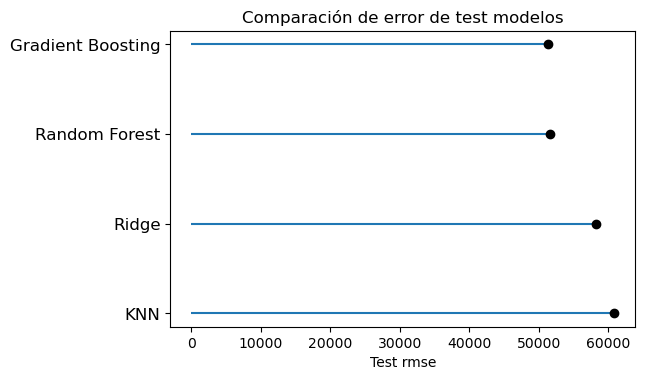

In [304]:
error_modelos = pd.DataFrame({
                        'modelo': ['KNN', 'Ridge', 'Random Forest', 'Gradient Boosting'],
                        'rmse': [rmse_knn, rmse_ridge, rmse_RF, rmse_gbr]
                     })
error_modelos = error_modelos.sort_values('rmse', ascending=False)

fig, ax = plt.subplots(figsize=(6, 3.84))
ax.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.rmse)
ax.plot(error_modelos.rmse, error_modelos.modelo, "o", color='black')
ax.tick_params(axis='y', which='major', labelsize=12)
ax.set_title('Comparación de error de test modelos'),
ax.set_xlabel('Test rmse');

# Descripción de los datos despues de la limpieza y preprocesamiento

In [229]:
df6.describe()

,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
count,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000,823.000000
mean,3.467801,2.616039,304.797570,1.656136,226.989028,2.063183,171609.199514,6.809235
std,0.791451,0.620678,141.948735,0.615776,121.704245,0.630447,108765.748325,6.024994
min,2.000000,1.000000,41.000000,1.000000,41.000000,1.000000,15500.000000,0.000000
25%,3.000000,2.000000,197.500000,1.000000,135.000000,2.000000,92000.000000,3.000000
50%,3.000000,3.000000,288.000000,2.000000,190.000000,2.000000,137000.000000,7.000000
75%,4.000000,3.000000,371.000000,2.000000,290.000000,2.000000,225000.000000,7.000000
max,5.000000,3.000000,819.000000,3.000000,687.000000,3.000000,539000.000000,53.000000


c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

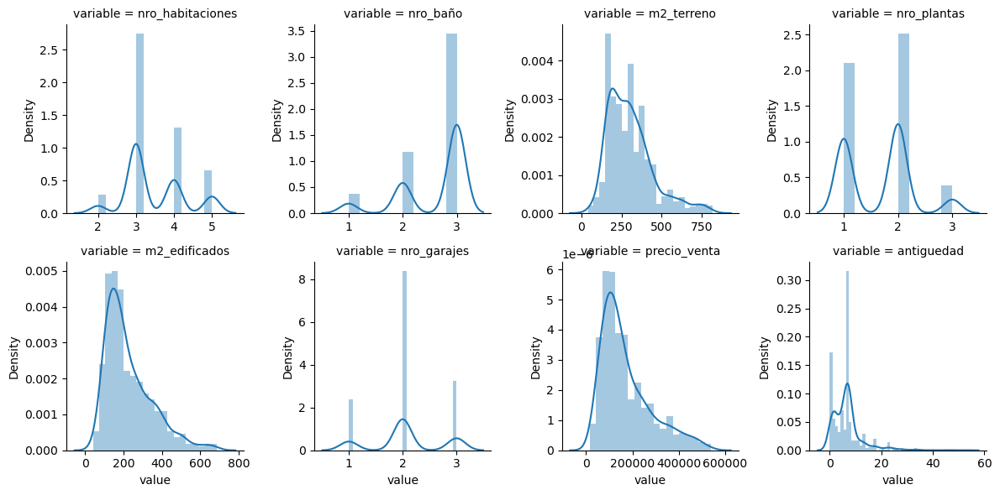

In [227]:
#Distribucion de los datos numericos
num = [f for f in df6.columns if df6.dtypes[f] != 'object']
nd = pd.melt(df6, value_vars = num)
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1

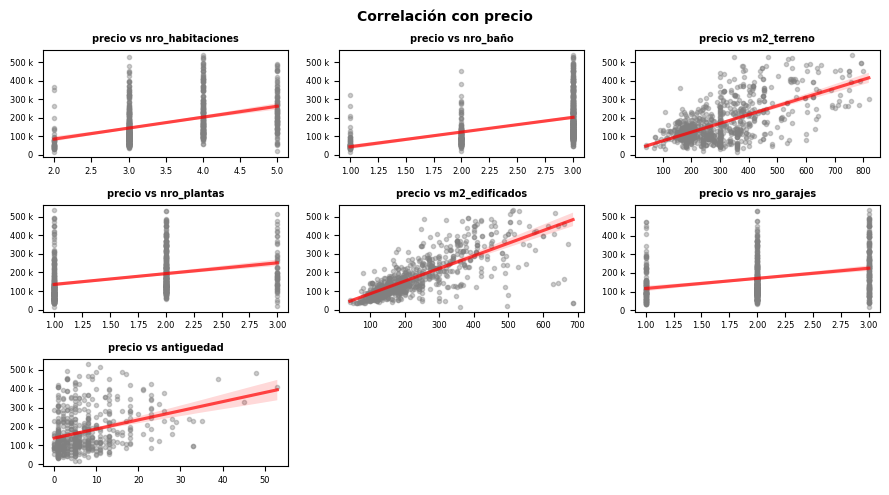

In [207]:
#Dispersion de los datos con respecto a la variable precio
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 5))
axes = axes.flat
for i, colum in enumerate(columns_numeric):
    sns.regplot(
        #x           = np.log(numeric_data[colum]),
        #y           = np.log(numeric_data['precio_venta']),
        x           = var_numx[colum],
        y           = var_numx['precio_venta'],
        color       = "gray",
        marker      = '.',
        scatter_kws = {"alpha":0.4},
        line_kws    = {"color":"r","alpha":0.7},
        ax          = axes[i]
    )
    axes[i].set_title(f"precio vs {colum}", fontsize = 7, fontweight = "bold")
    #axes[i].ticklabel_format(style='sci', scilimits=(-4,4), axis='both')
    axes[i].yaxis.set_major_formatter(ticker.EngFormatter())
    #axes[i].xaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# Se eliminan los axes vacíos
for i in [7,8]:
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Correlación con precio', fontsize = 10, fontweight = "bold");

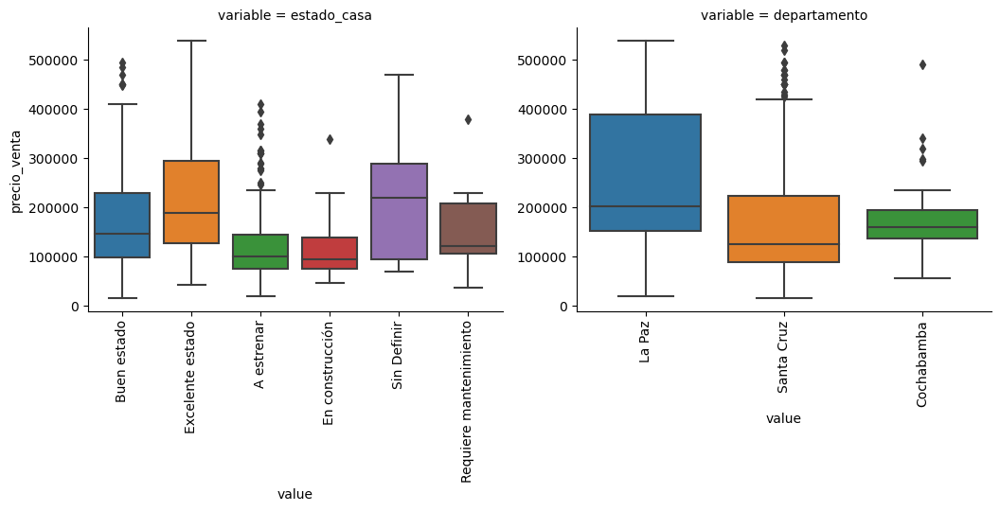

In [209]:
def boxplot(x,y,**kwargs):
            sns.boxplot(x=x,y=y)
            x = plt.xticks(rotation=90)

cat = [f for f in df4.columns if df6.dtypes[f] == 'object']

p = pd.melt(df6, id_vars='precio_venta', value_vars=cat)
g = sns.FacetGrid (p, col='variable', col_wrap=2, sharex=False, sharey=False, height=5.5, aspect=.97)
g = g.map(boxplot, 'value','precio_venta')
g

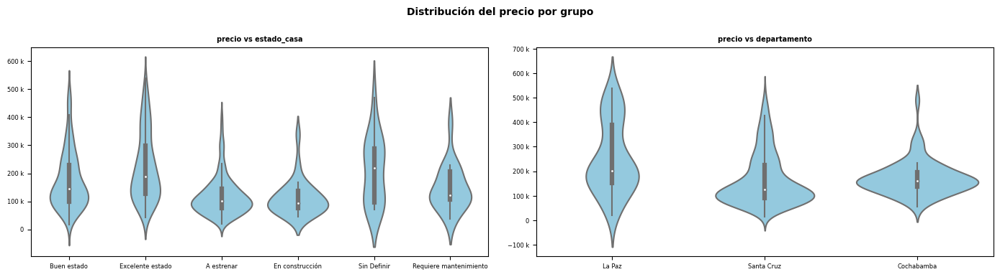

In [218]:
#De la misma manera ahora se puede observar la distiribucion de los datos categoricos en relacion al precio
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 7))
axes = axes.flat
columnas_object = df4.select_dtypes(include=['object']).columns

for i, colum in enumerate(columnas_object):
    sns.violinplot(
        x     = colum,
        y     = 'precio_venta',
        data  = df4,
        color = "skyblue",
        ax    = axes[i]
    )
    axes[i].set_title(f"precio vs {colum}", fontsize = 7, fontweight = "bold")
    axes[i].yaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# Se eliminan los axes vacíos
for i in [2, 3]:
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Distribución del precio por grupo', fontsize = 10, fontweight = "bold");

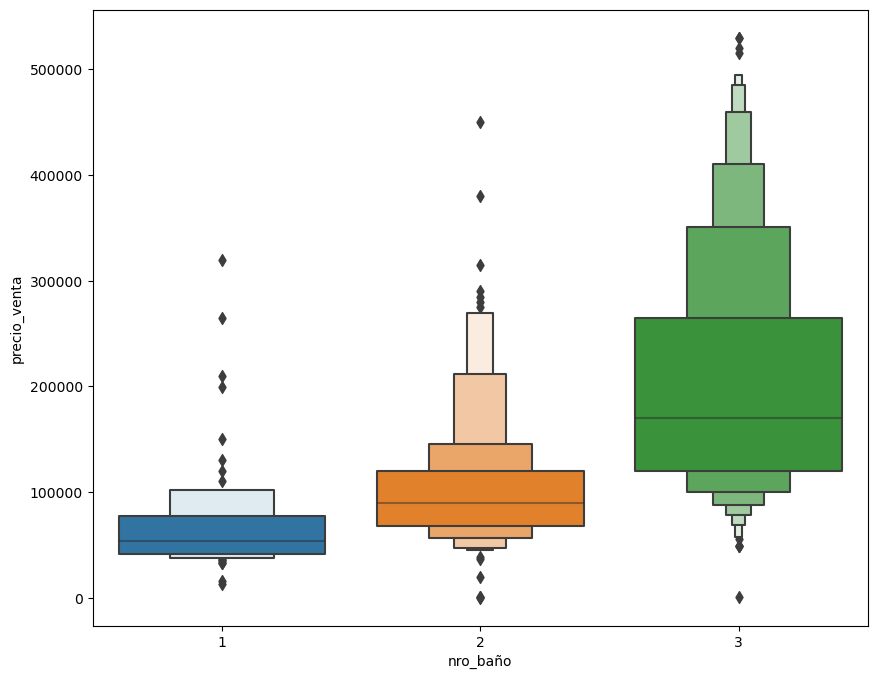

In [ ]:
sns.boxenplot(y="precio_venta",x='nro_baño',data=df6)
plt.show()

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:670: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


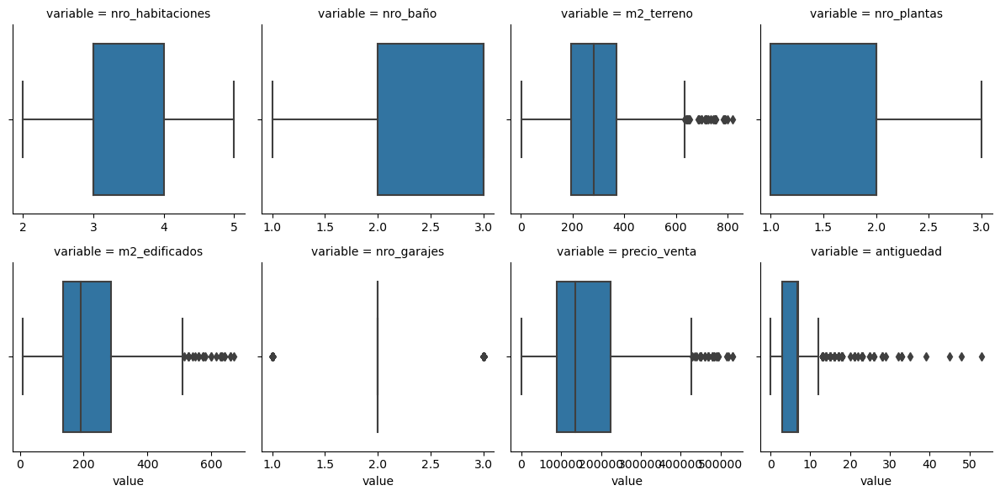

In [ ]:
boxsplotsCasas(df6)

## Estandarización

In [ ]:
#Funciones para obtener lista de variables numericas y object
def colums_nums(dfx):
    res = [f for f in dfx.columns if dfx.dtypes[f] != 'object']
    return res

def colums_objects(dfx):
    res = [f for f in dfx.columns if dfx.dtypes[f] == 'object']
    return res

array([[<AxesSubplot:title={'center':'nro_habitaciones'}>,
        <AxesSubplot:title={'center':'nro_baño'}>,
        <AxesSubplot:title={'center':'m2_terreno'}>],
       [<AxesSubplot:title={'center':'nro_plantas'}>,
        <AxesSubplot:title={'center':'m2_edificados'}>,
        <AxesSubplot:title={'center':'nro_garajes'}>],
       [<AxesSubplot:title={'center':'precio_venta'}>,
        <AxesSubplot:title={'center':'antiguedad'}>, <AxesSubplot:>]],
      dtype=object)

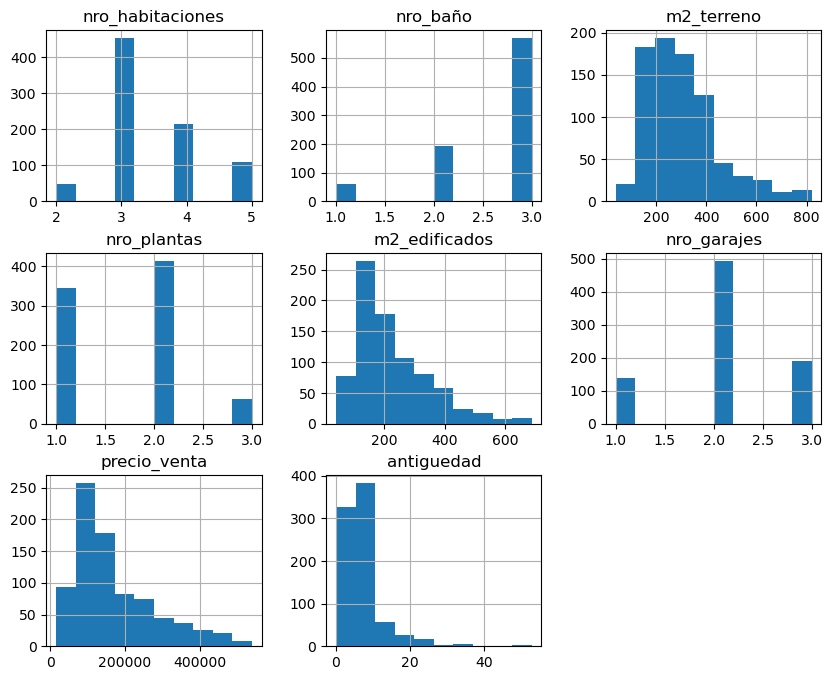

In [216]:
df6[colums_nums(df6)].hist()

In [214]:
# estandarizado = (X - rango_intercuartílico) / std
#datos menos distribuidos
#La distribucion de los datos no es afectada por los datos atipicos
df7_3 =df6.copy()
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
colnums=colums_nums(df7_3)
df7_3[colnums] = scaler.fit_transform(df7_3[colnums])
df7_3[colnums].head()

,nro_habitaciones,nro_baño,m2_terreno,nro_plantas,m2_edificados,nro_garajes,precio_venta,antiguedad
2,0.0,0.0,2.046110,-1.0,2.922581,1.0,2.345865,0.0
3,2.0,-1.0,-0.541787,-1.0,0.025806,0.0,0.015038,0.0
4,1.0,0.0,-0.749280,0.0,-0.206452,-1.0,0.090226,0.0
5,1.0,0.0,1.717579,-1.0,1.245161,0.0,2.015038,0.0
7,2.0,0.0,0.772334,0.0,0.729032,0.0,0.548872,0.0


array([[<AxesSubplot:title={'center':'nro_habitaciones'}>,
        <AxesSubplot:title={'center':'nro_baño'}>,
        <AxesSubplot:title={'center':'m2_terreno'}>],
       [<AxesSubplot:title={'center':'nro_plantas'}>,
        <AxesSubplot:title={'center':'m2_edificados'}>,
        <AxesSubplot:title={'center':'nro_garajes'}>],
       [<AxesSubplot:title={'center':'precio_venta'}>,
        <AxesSubplot:title={'center':'antiguedad'}>, <AxesSubplot:>]],
      dtype=object)

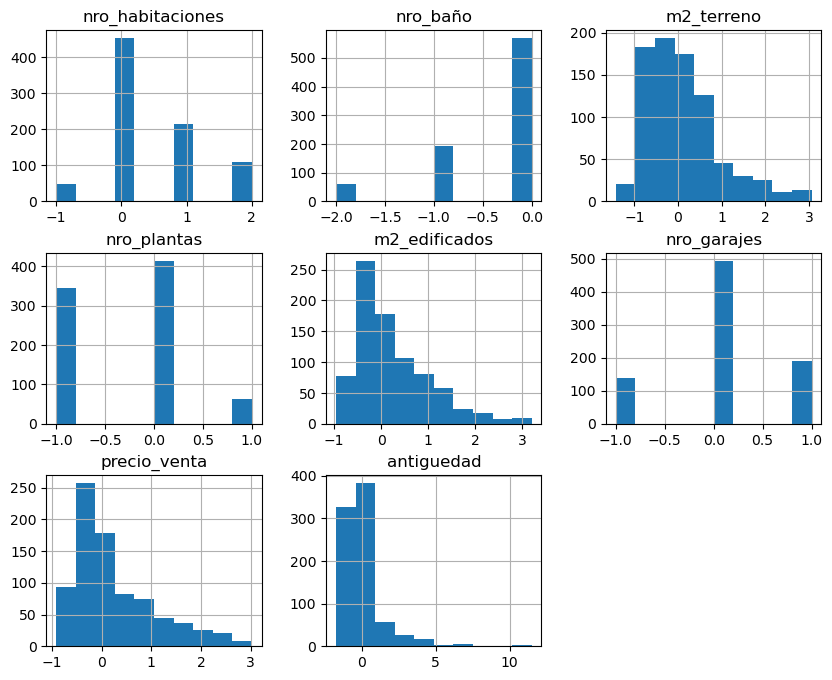

In [215]:
df7_3[colnums].hist()

array([[<AxesSubplot:title={'center':'nro_habitaciones'}>,
        <AxesSubplot:title={'center':'nro_baño'}>,
        <AxesSubplot:title={'center':'m2_terreno'}>],
       [<AxesSubplot:title={'center':'nro_plantas'}>,
        <AxesSubplot:title={'center':'m2_edificados'}>,
        <AxesSubplot:title={'center':'nro_garajes'}>],
       [<AxesSubplot:title={'center':'antiguedad'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

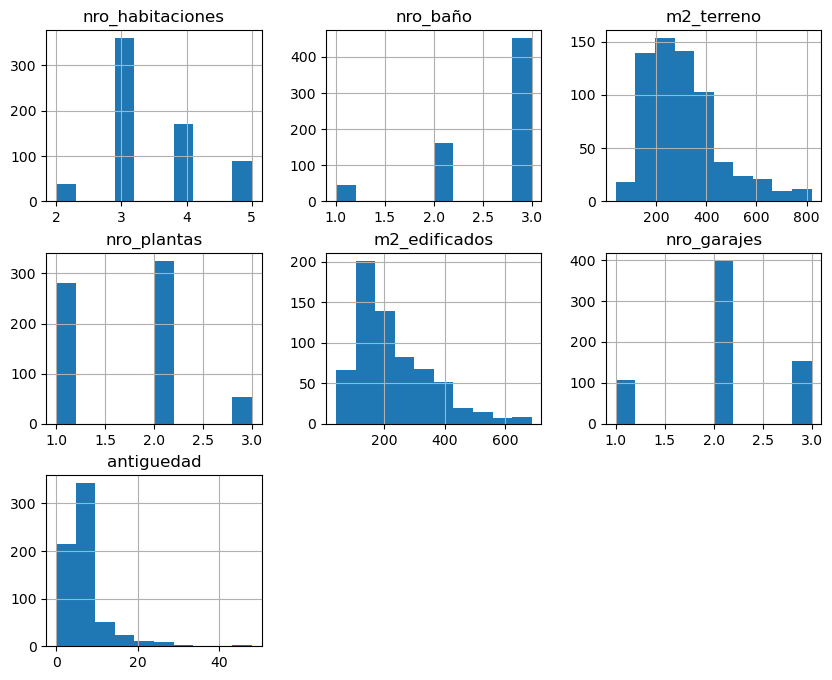

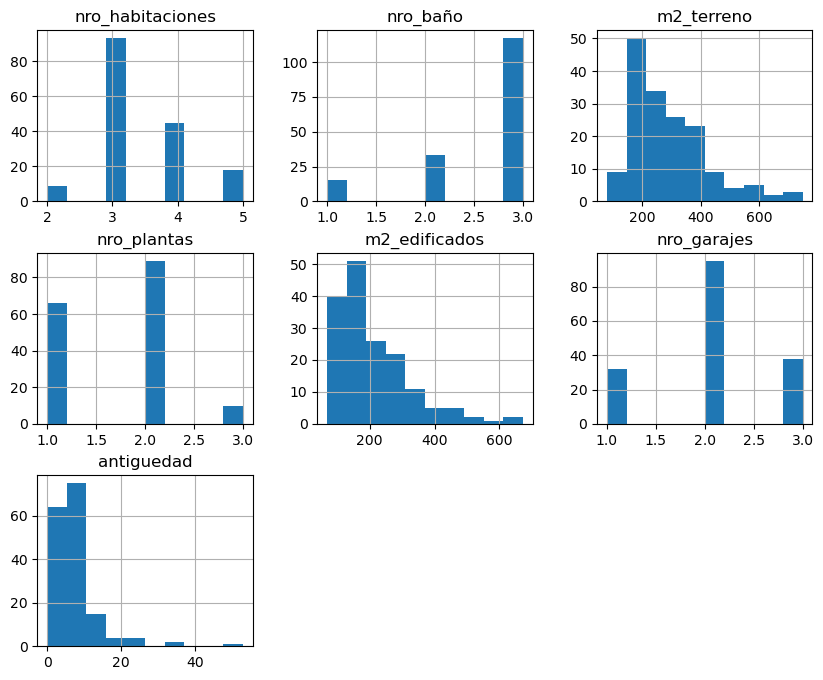

In [154]:
X_train.hist()
X_test.hist()